# Проектная работа
## Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

### Цель исследования:
- Исследовать рынок Москвы
- Найти интересные особенности
- Презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

### Ход исследования:
Данные о заведениях общественного питания Москвы я получу из датафрейма moscow_places.csv. О качестве данных нет никакой информации. Поэтому прежде чем приступить к анализу, понадобиться обзор данных, чтобы полученные в конечном итоге результаты были достоверны

Проверка данных будет на пропуски, дубликаты, соответствие типов данных, а также на наличие аномалий. В дальнейшем будут подобраны возможные пути устранения подобных дефектов для дальнейшего анализа. После обработки данных, я добавлю новые столбцы и приступлю к анализу

Поэтому мое исследование будет иметь следующий порядок действий:
- Изучить сткрутуру данных;
- Предобработать данные, устранив проблемы, которые могут повлиять на дальнейшее исследование (пропуски, неверный формат, дубликаты, аномалии в данных);
- Провести анализ общих данных, выявить закономерности;
- Изучить данные о кофейнях, выявить лучшие параметры для её открытия;
- Предоставить общий вывод;
- Сделать отчёт в виде презентации.

In [1]:
import re
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from IPython.core.display import display, HTML


from sklearn.impute import KNNImputer
from plotly import graph_objects as go
from folium import Map, Marker, Choropleth # импортируем карту и маркер и хороплет
from folium.plugins import MarkerCluster # импортируем кластер=
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None)

# выставляем ограничение на показ знаков после запятой
pd.options.display.float_format = '{:,.2f}'.format

# устанавливаем стиль графиков
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":100, 'savefig.dpi':200})
sns.set_context('notebook')  
sns.set_style("ticks")

## Шаг 1. Загрузите данные и изучите общую информацию

In [2]:
try:
    moscow_places_df = pd.read_csv('moscow_places.csv')
except: 
    moscow_places_df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
moscow_places_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [4]:
display(moscow_places_df.info())
print('Percent Nan count:')
display(pd.DataFrame(round(moscow_places_df.isna().mean().sort_values()*100,)
                     ).style.background_gradient('YlGnBu'))
print('Duplicates checking, for columns `name` & `address`:')
display(moscow_places_df[moscow_places_df.duplicated(subset=['name', 'address'])].size)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Percent Nan count:


,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
lat,0.000000
lng,0.000000
rating,0.000000
chain,0.000000
hours,6.000000
seats,43.000000


Duplicates checking, for columns `name` & `address`:


0

In [5]:
print('Количество заведений:', moscow_places_df.name.nunique())

Количество заведений: 5614


## Вывод:
- Датафрейм хранит информацию о 5614 заведениях
- Форматы практически у всех колонок верные (столбец seats содержит данные о количестве посадочных мест в виде чисел с плавающей точкой, что является ошибкой)
- Видим пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Пропусков в данных огромное количество. Просто удалить не получится, будут искажения в исследовании. Для дальнейшего исследования нам понадабятся столбец middle_avg_bill. Значения для этого столбца берутся из avg_bill

## Шаг 2. Предобработка данных
Для начала переведем все строковые колонки в нижний регистр (для простоты поиска дубликатов и визуализации)

In [6]:
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    moscow_places_df[col] = moscow_places_df[col].str.lower()
moscow_places_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00


### Пропуски
Просмотрим где имеются пропуски и как их можно заполнить

In [7]:
display(pd.DataFrame(round(moscow_places_df.isna().mean().sort_values()*100,)
                     ).style.background_gradient('YlGnBu'))

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
lat,0.000000
lng,0.000000
rating,0.000000
chain,0.000000
hours,6.000000
seats,43.000000


hours - информация о днях и часах работы. Пропусков достаточно мало, однако заменим их значением "Неизвестно". Аналогично поступим с колонками avg_bill - строка, которая хранит среднюю стоимость заказа в виде диапазона, price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

In [8]:
moscow_places_df['hours'] = moscow_places_df['hours'].fillna('Неизвестно')
moscow_places_df['avg_bill'] = moscow_places_df['avg_bill'].fillna('Неизвестно')
moscow_places_df['price'] = moscow_places_df['price'].fillna('Неизвестно')

Столбец middle_avg_bill содержит число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
К сожалению, заполнить пропуски качественно в данном случае не получится. Аналогично со стобцом middle_coffee_cup - содержит число с оценкой одной чашки капучино

seats - количество посадочных мест. Заменим пропуски в столбце seats значением "-1".

In [9]:
moscow_places_df['seats'] = moscow_places_df['seats'].fillna(-1)

Проверим обработку пропусков:

In [10]:
display(pd.DataFrame(round(moscow_places_df.isna().mean().sort_values()*100,)
                     ).style.background_gradient('YlGnBu'))

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,0.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,0.000000
avg_bill,0.000000


Как мы видим, удалось заполнить пракиически все пропуски

Проверим датафрейм на наличие дубликатов:

In [11]:
moscow_places_df.loc[moscow_places_df.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,3.20,Неизвестно,Неизвестно,NaN,NaN,0,-1.00
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,Неизвестно,Неизвестно,NaN,NaN,0,-1.00
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,Неизвестно,Неизвестно,NaN,NaN,0,188.00
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.81,37.50,4.20,Неизвестно,Неизвестно,NaN,NaN,1,188.00
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,Неизвестно,Неизвестно,NaN,NaN,0,150.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.81,37.64,4.40,Неизвестно,Неизвестно,NaN,NaN,1,150.00
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,Неизвестно,Неизвестно,NaN,NaN,1,276.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,Неизвестно,55.74,37.41,4.10,Неизвестно,Неизвестно,NaN,NaN,0,276.00


Явным дубликатом выглядит вторая строка с данными ресторана "More Poke" и "кафе" Вторые строки для заведений "Раковарня клешни и хвосты" и "Хлеб да выпечка" содержат разные категории заведений и немного разные координаты. Так как адрес один, будем считать это дубликатами и удалим дублирующие строки.

In [12]:
moscow_places_df.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)

In [13]:
moscow_places_df.duplicated(subset=['name', 'address']).sum()

0

Проверим на неявные дубликаты названия категорий заведений и районы.

In [14]:
moscow_places_df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [15]:
moscow_places_df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Неявных дубликатов в столбцах category и district нет

Попробуем поискать неявные дубликаты по первому слову в названии заведения. Для этого создадим столбец с первым словом в названии и поищем дубликаты по этому столбцу, столбцу category и address.

In [16]:
moscow_places_df['dup_name'] = moscow_places_df['name'].str.split(' ').str[0]
moscow_places_df.duplicated(subset=['dup_name', 'category', 'address']).sum()

15

Обнаружено 15 дубликатов. Выведем строки с дубликатами.

In [17]:
moscow_places_df.loc[moscow_places_df.duplicated(subset=['dup_name', 'category', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dup_name
20,чебуреки манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,4.30,Неизвестно,Неизвестно,NaN,NaN,1,148.00,чебуреки
55,чебуреки и манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,4.30,Неизвестно,Неизвестно,NaN,NaN,0,148.00,чебуреки
416,чайхана халал,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.86,37.48,4.30,Неизвестно,Неизвестно,NaN,NaN,0,53.00,чайхана
450,чайхана халаль,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.86,37.48,4.30,Неизвестно,Неизвестно,NaN,NaN,1,53.00,чайхана
1642,кафе для поминок,кафе,"москва, улица верхняя масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.79,37.57,4.90,Неизвестно,Неизвестно,NaN,NaN,0,50.00,кафе
1671,кафе замок,кафе,"москва, улица верхняя масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.79,37.57,4.20,средние,средний счёт:700–1000 ₽,850.00,NaN,0,50.00,кафе
2384,хлеб насущный,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.66,4.10,Неизвестно,Неизвестно,NaN,NaN,1,200.00,хлеб
2467,хлеб насущный экспресс,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.78,37.65,4.10,Неизвестно,Неизвестно,NaN,NaN,0,200.00,хлеб
2719,dragon bubble tea,кафе,"москва, щёлковское шоссе, вл75",Восточный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.81,37.80,4.00,Неизвестно,Неизвестно,NaN,NaN,0,-1.00,dragon
2833,царская кофейня,кофейня,"москва, измайловское шоссе, 73ж",Восточный административный округ,"сб,вс 10:00–20:00",55.79,37.75,4.00,Неизвестно,Неизвестно,NaN,NaN,0,-1.00,царская


У этих заведений похожие названия, совпадают категории и адреса. По-видимому, некоторые из них представляют собой разные заведения, находящиеся в одном здании, либо разные залы одного заведения. Часть заведений является дубликатами. Удалим строки, которые по всей видимости являются дубликатами.

In [18]:
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "чебуреки манты") & (moscow_places_df['address'] == "москва, правобережная улица, 1б")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "чайхана халал") & (moscow_places_df['address'] == "москва, смольная улица, 24г, стр. 6")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "dragon bubble tea") & (moscow_places_df['address'] == "москва, щёлковское шоссе, вл75")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "баку 24 часа") & (moscow_places_df['address'] == "москва, монтажная улица, 9, стр. 1")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "udcкафе upside down cake") & (moscow_places_df['address'] == "москва, кутузовский проспект, 57")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "vip wok and sushi") & (moscow_places_df['address'] == "москва, можайское шоссе, 45б")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "от мяса до рыбы") & (moscow_places_df['address'] == "москва, улица вавилова, 64/1с1")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "чайхана дружба") & (moscow_places_df['address'] == "москва, большая очаковская улица, 47а, стр. 1")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "estetica cafe") & (moscow_places_df['address'] == "москва, кировоградская улица, 15")].index)
moscow_places_df = moscow_places_df.drop(moscow_places_df[(moscow_places_df['name'] == "кафе") & (moscow_places_df['address'] == "москва, ореховый бульвар, 28")].index)
moscow_places_df.loc[moscow_places_df.duplicated(subset=['dup_name', 'category', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dup_name
1642,кафе для поминок,кафе,"москва, улица верхняя масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.79,37.57,4.90,Неизвестно,Неизвестно,NaN,NaN,0,50.00,кафе
1671,кафе замок,кафе,"москва, улица верхняя масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.79,37.57,4.20,средние,средний счёт:700–1000 ₽,850.00,NaN,0,50.00,кафе
2384,хлеб насущный,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.66,4.10,Неизвестно,Неизвестно,NaN,NaN,1,200.00,хлеб
2467,хлеб насущный экспресс,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.78,37.65,4.10,Неизвестно,Неизвестно,NaN,NaN,0,200.00,хлеб
2833,царская кофейня,кофейня,"москва, измайловское шоссе, 73ж",Восточный административный округ,"сб,вс 10:00–20:00",55.79,37.75,4.00,Неизвестно,Неизвестно,NaN,NaN,0,-1.00,царская
2903,царская трапеза,кофейня,"москва, измайловское шоссе, 73ж",Восточный административный округ,"пн-пт 10:00–19:00; сб,вс 10:00–20:00",55.79,37.75,4.20,Неизвестно,Неизвестно,NaN,NaN,0,-1.00,царская
7309,хинкальная,быстрое питание,"москва, мкад, 14-й километр, 2, стр. 1",Юго-Восточный административный округ,"ежедневно, 08:00–19:00",55.65,37.83,4.90,Неизвестно,Неизвестно,NaN,NaN,1,-1.00,хинкальная
7313,хинкальная,быстрое питание,"москва, тихорецкий бульвар, 1, стр. 6",Юго-Восточный административный округ,"ежедневно, 07:00–19:00",55.67,37.78,4.90,Неизвестно,Неизвестно,NaN,NaN,1,-1.00,хинкальная
7326,хинкальная экспресс,быстрое питание,"москва, тихорецкий бульвар, 1, стр. 6",Юго-Восточный административный округ,"ежедневно, 06:00–18:00",55.67,37.78,4.90,Неизвестно,Неизвестно,NaN,NaN,0,-1.00,хинкальная
7404,хинкальная экспресс,быстрое питание,"москва, мкад, 14-й километр, 2, стр. 1",Юго-Восточный административный округ,"ежедневно, 07:00–19:00",55.65,37.83,4.70,Неизвестно,Неизвестно,NaN,NaN,1,-1.00,хинкальная


Дубликаты обработаны. Удалим столбец dup_name.

In [19]:
moscow_places_df = moscow_places_df.drop(['dup_name'], axis=1)

Изменим тип данных на int:

In [20]:
moscow_places_df['seats'] = moscow_places_df['seats'].astype('int')

In [21]:
moscow_places_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8392 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8392 non-null   object 
 1   category           8392 non-null   object 
 2   address            8392 non-null   object 
 3   district           8392 non-null   object 
 4   hours              8392 non-null   object 
 5   lat                8392 non-null   float64
 6   lng                8392 non-null   float64
 7   rating             8392 non-null   float64
 8   price              8392 non-null   object 
 9   avg_bill           8392 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8392 non-null   int64  
 13  seats              8392 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 983.4+ KB


Теперь все форматы выглядят корректно

Проверка на ошибки в данных

In [22]:
def display_side_by_side(dfs: list, captions: list, space_width=10):
    output = ""
    combined = dict(zip(captions, dfs))

    for caption, df in combined.items():
        output += (df.style.set_properties(**{'text-align': 'left'})
                   .set_table_attributes("style='display:inline'")
                   .set_caption(caption)._repr_html_())
        output += "\xa0" * space_width

    display(HTML(output))

,0
0,Северный административный округ
1,Северо-Восточный административный округ
2,Северо-Западный административный округ
3,Западный административный округ
4,Центральный административный округ
5,Восточный административный округ
6,Юго-Восточный административный округ
7,Южный административный округ
8,Юго-Западный административный округ
,0


Watch for scatter for coordinates:


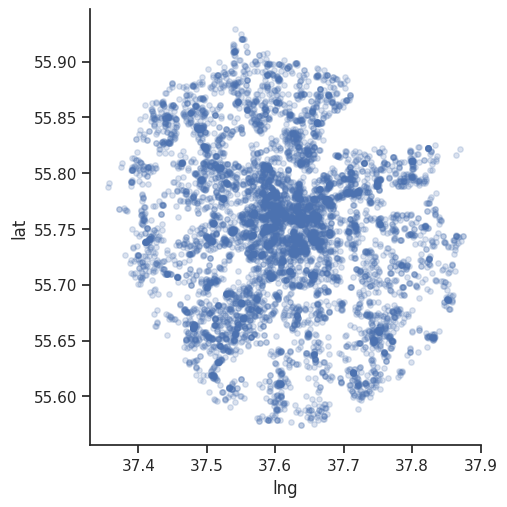

In [23]:
display_side_by_side([
    pd.DataFrame(moscow_places_df['district'].unique()),
    pd.DataFrame(moscow_places_df['category'].unique()),
    pd.DataFrame(moscow_places_df['rating'].describe())
],
    [
    'Unique values of `district`',
    'Unique values of `category`',
    'Describe of `rating`'
], 10)
print('Watch for scatter for coordinates:')
sns.lmplot(x="lng", y="lat", data=moscow_places_df, fit_reg=False,
           scatter_kws={'s': 15, 'alpha': 0.2});

На первый взгляд, ошибок в основных столбцах нет:
- некорректных округов нет
- категории разбиты более чем логично
- рейтинг не имеет аномальных значений
- координаты образуют собой карту Москвы

## Добавление новых столбцов

- Создайте столбец street с названиями улиц из столбца с адресом.
- Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    -логическое значение True — если заведение работает ежедневно и круглосуточно;
    -логическое значение False — в противоположном случае.

In [24]:
def get_street(address):
    address = address.strip().lower()
    address = re.sub(r'\s*,\s*', ',', address)
    address = re.split(',|\.', address)
    return address[1]

In [25]:
def is_24_7(time):
    if time != time:
        return np.nan
    elif time == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [26]:
moscow_places_df['street'] = moscow_places_df['address'].apply(get_street)
moscow_places_df['is_24_7'] = moscow_places_df['hours'].apply(is_24_7)

In [27]:
moscow_places_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,Неизвестно,Неизвестно,NaN,NaN,0,-1,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,"1,000.00",NaN,0,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,Неизвестно,цена чашки капучино:155–185 ₽,NaN,170.00,0,-1,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148,правобережная улица,False


## Вывод
- все строковые данные были переведены в нижний регистр для простоты восприятия
- дубликаты были выявлены и устранены
- Удалось заполнить практически все пропуски (кроме столбцов middle_avg_bill, middle_coffe_cup)
- аномалий в данных найдено не было
- были добавлены столбцы с названиями улиц "street" и с маркером работы 24/7 "is_24_7"

## Шаг 3. Анализ данных

### 1. Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [28]:
import plotly.io as pio
pio.renderers.default='notebook'
category = pd.DataFrame(moscow_places_df.groupby('category')['category'].count())
fig = px.pie(category, values='category', names=category.index)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [29]:
category_name = moscow_places_df.groupby('category')['name'].count().reset_index()
category_name.columns = ['category', 'count']
category_name.style.background_gradient('coolwarm')

,category,count
0,"бар,паб",764
1,булочная,256
2,быстрое питание,602
3,кафе,2370
4,кофейня,1412
5,пиццерия,633
6,ресторан,2040
7,столовая,315


In [30]:
fig = px.bar(category_name, 
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов общественного питания по видам',
             template='plotly_white'
            )
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

### Вывод
Список заведений по категориям (по убыванию количества):

- 28% (2370 заведений) - кафе
- 24% (2040 заведений) - ресторан
- 17% (1412 заведений) - кофейня
- 7%-9% - бар/паб (764 заведений), пиццерия (633 заведений), быстрое питание (602 заведений)
- 3%-4% - столовая (315 заведений), булочная (256 заведений)

Кафе и рестораны составляют более чем половину (около 52,6%) от общего числа заведений, в то время как кофейни, бары/пабы и пиццерии представлены чуть менее чем третью частью (33,43%). Оставшиеся заведения, такие как булочные, столовые и быстрое питание занимают 13,97% от общего числа.

### 2.Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. 

In [31]:
seats = moscow_places_df.query('seats != -1') \
            .groupby('category') \
            .agg(seats_median=('seats', 'median')) \
            .sort_values(by='seats_median', ascending=False) \
            .reset_index()
seats['seats_median'] = seats['seats_median'].astype('int')

In [32]:
# строим столбчатую диаграмму 
fig = px.bar(seats.sort_values(by='seats_median', ascending=True), # загружаем данные и заново их сортируем
             x='seats_median', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats_median',
             template='plotly_white'# добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество посадочных мест в объектах общественного питания по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория объекта общественного питания')
fig.show() # выводим график

### Вывод
Рестораны предоставляют наибольшее количество мест для посадки (86 мест), что логично, поскольку такая специализация предполагает отдых и питание гостей. На втором месте - бары/пабы (82 мест). В то же время, пиццерии и булочные предлагают наименьшее количество мест для посадки (55 и 50 мест соответственно).

### 3. Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше? Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [33]:
chain_category = ['сетевые', 'несетевые']
values = [len(moscow_places_df.query('chain == 1')), len(moscow_places_df.query('chain == 0'))]

fig = go.Figure(data=[go.Pie(labels=chain_category, values=values)])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений общественного питания', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

Судя по диаграмме, можно утверждать, что примерно 62% ресторанов в Москве не принадлежат к какой-либо сети.

In [34]:
# Посмотрим какие категории заведений чаще являются сетевыми
chains = moscow_places_df.groupby(by=['category', 'chain'], as_index=False).agg(
    count=('name', 'count'))
chains.loc[chains['chain'] == 0, 'chain'] = 'не сетевое'
chains.loc[chains['chain'] == 1, 'chain'] = 'сетевое'
for i in range(len(chains)):
    chains.at[i, 'ratio'] = str(round(
        chains.loc[i]['count']/len(moscow_places_df[moscow_places_df['category'] == chains.loc[i]['category']]), 1) * 100) + '%'

In [35]:
def func_grafics(df, x, y, color, text=None,
                     title='default tittle', xaxis_title='default xaxis tittle', yaxis_title='default yaxis tittle',
                     legend_title='default legend tittle', barmode='stack',
                     orientation='v', height=500, showlegend=True, for_export=False):

    fig = px.bar(df, x=x, y=y, color=color, text=text, barmode=barmode)

    fig.update_layout(
        height=height,
        showlegend=showlegend,
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        legend_title=legend_title,
        xaxis = {"categoryorder":"total descending"}
    )
    
    if for_export == True:
        fig.update_layout({
            'plot_bgcolor': 'rgba(0, 0, 0, 0)',
            'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        })

    return fig

In [36]:
fig = func_grafics(
    df=chains,
    x='category', y='count', color='chain', text='ratio',
    title='Соотношение и число сетевых кафе по категориям',
    xaxis_title='категория', yaxis_title='число кафе',
    legend_title='Является ли кафе сетевым?',height=450
)
fig.show()

## Вывод
Согласно графику, большинство заведений не относятся к сетевым, за исключением нескольких категорий: для кофеен количество сетевых заведений имеет практически такое же количество как и независимых (50%|50%), такая же ситуация и с пиццериями. Однако в ситуации с булочными процент сетевых заведений преобладает над процентом независимых заведений (60%|40%)

### 4. Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.

In [37]:
df_chain = moscow_places_df[moscow_places_df['chain'] == 1]
top_15 = df_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,120
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,71
4,яндекс лавка,4.00,ресторан,69
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,39


In [38]:
fig = px.bar(top_15,
             x='count',
             y='name',
             text='count',
             template='plotly_white'
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False)
fig.show()

In [39]:
df_chain_categoru_top_15 = df_chain[df_chain['name'].isin(top_15['name'].to_list())]
df_chain_categoru_top_15 = df_chain_categoru_top_15.groupby('category')['name'].count().reset_index()

In [40]:
fig = px.bar(df_chain_categoru_top_15,
             x='category',
             y='name',
             text='name',
             template='plotly_white'
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False,
                   xaxis = {"categoryorder":"total descending"})
fig.show()

In [41]:
df_chain_category = df_chain.groupby('category')['name'].count().reset_index()

In [42]:
fig = go.Figure(data=[go.Pie(labels=df_chain_category['category'], values=df_chain_category['name'])])
fig.update_layout(title='Типы сетевых заведений', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show() 

## Вывод
По результатам мы можем заключить, что среди сетевых заведений в Москве первое место занимает Шоколадница (120 заведений), второе и третье места заняли домино'с пицца (76 заведений) и додо пицца (74 заведений) соответственно, а наименьшее количество заведений относится к сети Му-Му (27 заведений).

### 5. Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [43]:
dist = moscow_places_df.groupby(['district'])['name'].count().reset_index()
fig = go.Figure(data=[go.Pie(labels=dist['district'], values=dist['name'])])
fig.update_layout(title='Распределение заведений по районам', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Район',
                                    showarrow=False)])
fig.show()

In [44]:
fig = px.sunburst(moscow_places_df.groupby(['district','category'])['name'].count().reset_index(), 
                  path=['district','category'], 
                  values='name',
                  branchvalues="total",
                  title='Распределение категорий кафе по районам')
fig.show()

In [45]:
fig = px.bar(
    moscow_places_df.groupby(['district','category'])['name'].count().reset_index().sort_values(by='name'),
    x='district', y='name', color='category'
)
fig.update_layout(xaxis = {"categoryorder":"total descending"},
                 title='Количество заведений каждой категории по районам',
                   xaxis_title='Название района',
                   yaxis_title='Количество заведений',
                   legend_title='Категория')
fig.show()

## Вывод
Ожидаемо больше всего заведений в Центральном административном округе (2242 заведений), так же в нем в отличие от других районов, доминируют рестораны (670 заведений). В остальных районах количество заведений не сильно разница (от 700 до 900 шт.), выделить можно только Северо-западный административный округ, в котором всего 409 заведений

### 6.Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

Визуализируем распределение средних рейтингов по категориям заведений.

In [46]:
rating_category = moscow_places_df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [47]:
fig = px.bar(rating_category,
             x='rating',
             y='category',
             text='rating',
             template='plotly_white'                  
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

## Вывод:
Согласно данным на графике, бары и пабы имеют наивысший рейтинг - 4.39, тогда как пиццерии, рестораны, кофейни и булочные имеют примерно одинаковый рейтинг - 4.3. Рестораны быстрого питания имеют наименьший рейтинг - 4.05. Кроме того, средние значения по всем категориям превышают 4 в нашей выборке.

### 7. Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [48]:
import requests
response = requests.get("https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson")
geo_json = json.loads(response.text)

In [49]:
fig = px.choropleth_mapbox(moscow_places_df.groupby(['district'])['rating'].mean().reset_index().sort_values(by='rating', ascending=False),
                               geojson=geo_json,
                               color='rating',
                               locations='district',
                               featureidkey='properties.name',
                               center={"lat": 55.751244, "lon": 37.618423},
                               hover_name='rating'
                               )
fig.update_geos(fitbounds="locations")
fig.update_layout(
margin={"r": 0, "t": 0, "l": 0, "b": 0},
height=500,
mapbox_style="carto-positron"
)

In [50]:
moscow_places_df.groupby(['district'])['rating'].mean().reset_index().sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [51]:
fig = px.bar(
    moscow_places_df.groupby(['district'])['rating'].mean().reset_index(),
    x='district', y='rating'
)
fig.update_layout(
    yaxis_range=[3.9, 4.5],
    title='Распределение средних рейтингов по районам',
    xaxis_title='Название районов',
    yaxis_title='Рейтинг',
    xaxis = {"categoryorder":"total descending"}
)
fig.show()

## Вывод
На основании предоставленных данных можно сделать вывод о том, что у заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38. В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1.

### 8. Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [52]:
import folium
from folium.plugins import MarkerCluster

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_mow = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_mow)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places_df.apply(create_clusters, axis=1)


0       None
1       None
2       None
3       None
4       None
        ... 
8401    None
8402    None
8403    None
8404    None
8405    None
Length: 8392, dtype: object

In [53]:
map_mow

## Вывод
По карте отчетливо видно, что основная масса заведений сконцентрирована в центре Москвы. Уже меньше на севере и еще меньше на юге.

### 9. Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [54]:
streets = moscow_places_df.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).head(15).index.tolist()
street_top_15 = moscow_places_df[moscow_places_df['street'].isin(streets)]

In [55]:
fig = px.bar(street_top_15.groupby(['street','category'])['name'].count().reset_index(), 
             x='street', 
             y='name', 
             color='category', 
             text = 'name')
fig.update_layout(xaxis = {"categoryorder":"total descending"},
                 title='Количество заведений каждой категории по улицам',
                   xaxis_title='Название улиц',
                   yaxis_title='Количество заведений',
                   legend_title='Категория')
fig.show()

## Вывод
Из графика выше мы видим, что больше всего заведений на проспекте Мира (183 заведений). Преобладают категории кафе (53 заведения) и рестораны (45 заведений). Столовых меньше всего (2 заведения). Следом за ним идет Профсоюзная (122 заведения), ситуация с категориями там аналогична. Меньше всего заведений на улица Миклухо-Маклая (49 заведений). Среди популярных категорий также кафе (21 заведение) и рестораны (15 заведений).

### 10. Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [56]:
one_cafe = moscow_places_df['street'].value_counts().reset_index()
one_cafe.columns = ['street_name', 'cafe_count']
one_cafe = one_cafe[one_cafe['cafe_count'] == 1]
one_cafe

,street_name,cafe_count
990,улица бусиновская горка,1
991,переулок капранова,1
992,одинцовская улица,1
993,кузьминская улица,1
994,хитровский переулок,1
...,...,...
1441,улица вучетича,1
1442,денежный переулок,1
1443,4-й воробьёвский проезд,1
1444,скатертный переулок,1


In [57]:
#создадим таблицу с названиями улиц и категорий
streets_category = moscow_places_df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street_name,category,count
2137,проспект мира,кафе,53
2140,проспект мира,ресторан,45
1520,мкад,кафе,45
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
...,...,...,...
1535,молодёжная улица,"бар,паб",1
1536,молодёжная улица,кофейня,1
1538,монтажная улица,кофейня,1
1539,монтажная улица,ресторан,1


In [58]:
#добавим районы
streets1_category = streets_category[streets_category['street_name'].isin(one_cafe['street_name'])]
streets1_category = streets1_category.groupby('category')['street_name'].count().reset_index()
streets1_category

,category,street_name
0,"бар,паб",39
1,булочная,8
2,быстрое питание,23
3,кафе,159
4,кофейня,83
5,пиццерия,15
6,ресторан,93
7,столовая,36


In [59]:
fig = px.bar(streets1_category, 
             x='category', 
             y='street_name', 
             text = 'street_name')
fig.update_layout(xaxis = {"categoryorder":"total descending"},
                 title='Количество заведений каждой категориb',
                   xaxis_title='Rfntujhbz',
                   yaxis_title='Количество заведений',
                   legend_title='Категория')
fig.show()

## Вывод
Из данных выше мы видим, что 425 улиц имеют только одно заведение. Больше всего из них относятся к категории кафе.

### 11. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [60]:
avg_bill_by_district = moscow_places_df.groupby('district', as_index=False).agg(
    avg_bill=('middle_avg_bill', 'median'))

In [61]:
avg_bill_by_district.sort_values(by='avg_bill', ascending = False)

,district,avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [62]:
fig = px.choropleth_mapbox(avg_bill_by_district,
                               geojson=geo_json,
                               color='avg_bill',
                               locations='district',
                               featureidkey='properties.name',
                               center={"lat": 55.751244, "lon": 37.618423},
                               hover_name='avg_bill'
                               )
fig.update_geos(fitbounds="locations")
fig.update_layout(
margin={"r": 0, "t": 0, "l": 0, "b": 0},
height=500,
mapbox_style="carto-positron"
)

In [63]:
avg_bill_by_category = moscow_places_df.groupby('category', as_index=False).agg(
    avg_bill=('middle_avg_bill', 'mean')).sort_values(by='avg_bill', ascending = False)

In [64]:
avg_bill_by_category

,category,avg_bill
6,ресторан,"1,367.88"
0,"бар,паб","1,338.76"
5,пиццерия,789.38
3,кафе,707.75
1,булочная,658.77
4,кофейня,614.21
2,быстрое питание,445.76
7,столовая,335.35


## Вывод
Из приведенных данных можно сделать вывод, что Центральный и Западный округа имеют наибольший средний чек в сравнении с Юго-Восточным округом, который имеет наименьший средний чек. Округи вблизи Центрального округа имеют в среднем средний чек на 1,5 - 2 раза выше, чем округа вдали от центра.

## Общий вывод
Анализ показал, что наибольшее количество заведений в Москве - кафе (2370), немного меньше - рестораны (2040), и наименьшее количество - булочные (256 заведений).

Кафе и рестораны составляют почти 52,6% от общего числа заведений, в то время как кофейни, бары/пабы и пиццерии составляют 33,43%, а булочные, столовые и заведения быстрого питания - 13,97%. Рестораны предоставляют наибольшее количество посадочных мест, а заведения быстрого питания распространены шире всего. Кофейни занимают первое место по количеству сетевых заведений, за которой следует категория пиццерий.

Рестораны предоставляют наибольшее количество мест для посадки (86 мест), что логично, поскольку такая специализация предполагает отдых и питание гостей. На втором месте - бары/пабы (82 мест). В то же время, пиццерии и булочные предлагают наименьшее количество мест для посадки (55 и 50 мест соответственно).

Среди сетевых заведений в Москве первое место занимает Шоколадница (120 заведений), второе и третье места заняли домино'с пицца (76 заведений) и додо пицца (74 заведений) соответственно, а наименьшее количество заведений относится к сети Му-Му (27 заведений).

Ожидаемо, что больше всего заведений в Центральном административном округе (2242 заведений), так же в нем в отличие от других районов, доминируют рестораны (670 заведений). В остальных районах количество заведений не сильно разница (от 700 до 900 шт.), выделить можно только Северо-западный административный округ, в котором всего 409 заведений

Бары и пабы имеют наивысший рейтинг - 4.39, тогда как пиццерии, рестораны, кофейни и булочные имеют примерно одинаковый рейтинг - 4.3. Рестораны быстрого питания имеют наименьший рейтинг - 4.05. Кроме того, средние значения по всем категориям превышают 4 в нашей выборке.

У заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38. В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1.

Больше всего заведений на проспекте Мира (183 заведений). Преобладают категории кафе (53 заведения) и рестораны (45 заведений). Столовых меньше всего (2 заведения). Следом за ним идет Профсоюзная (122 заведения), ситуация с категориями там аналогична. Меньше всего заведений на улица Миклухо-Маклая (49 заведений). Среди популярных категорий также кафе (21 заведение) и рестораны (15 заведений).

Из приведенных данных можно сделать вывод, что Центральный и Западный округа имеют наибольший средний чек в сравнении с Юго-Восточным округом, который имеет наименьший средний чек. Разброс среднего чека по районам достигает 18% с медианой в 913 рублей
Наибольший средний чек у ресторанов (1,166 рублей) и пабов (1,131 рублей), а наименьший у столовых (600 рублей) и заведений быстрого питания (756 рублей) 


## Шаг 4. Детализируем исследование: открытие кофейни

Ответим на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Посчитаем количество и посмотрим на их расположение.

In [65]:
cofe_df = moscow_places_df[moscow_places_df['category'] == 'кофейня']
print('Всего коффен:', cofe_df.shape[0])

Всего коффен: 1412


In [66]:
# создаём карту Москвы
map_mow3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_mow3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_df.apply(create_clusters, axis=1)

# выводим карту
map_mow3

У нас имеется 1412 кофейных мест. Большинство из них расположены в Центральном районе. На втором месте кафе сконцентрировались на юго-западные и в северной части города.

Посмотрим, есть ли круглосуточные кофейни.

In [67]:
def make_acronym(phrase):
    phrase = phrase.replace('-', ' ').split()
    acronym = ""
    for word in phrase:
        acronym = acronym + word[0].upper()
    return acronym

# Добавим акронимы к районам
moscow_places_df['district_short'] = moscow_places_df['district'].apply(make_acronym)

In [68]:
coffee = moscow_places_df.query('hours == "ежедневно, круглосуточно" & category == "кофейня"')
coffee_house = moscow_places_df.query('hours == "ежедневно, круглосуточно" & category == "кофейня"') \
                   .groupby(by=['district_short'], as_index=False) \
                   .agg(count=('name', 'count'))
print(f'Количество кругосуточных кофеен: {coffee_house["count"].sum()}')

Количество кругосуточных кофеен: 59


In [69]:
fig = px.bar(
    data_frame=coffee_house.sort_values('count',ascending=False),
    x='district_short', y='count', color='district_short', text='count',
    title='Количество кофеен 24/7 по районам',
    labels={'district_short': 'Район', 'count': 'Количество кафе'},
    height=450
)

fig.update_layout(
    legend_title='Часы работы',
    template='plotly_white'
)
fig.show()


In [70]:
# создаём карту Москвы
map_mow4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_mow4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
map_mow4

Из этого можно сделать вывод, что в центре города наиболее распространены круглосуточные кофейни, в то время как в остальных районах это отсутствует или представлено в минимальном количестве.

Посмотрим какие у кофеен рейтинги. Как они распределяются по районам.

In [71]:
rating_cofe = cofe_df.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_cofe

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [72]:
# создаём карту Москвы
map_mow5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_mow5)

# выводим карту
map_mow5


Можно сделать вывод о том что как центральный административный округ (средний показатель рейтинга 4,34), так и северо-западный округ (средний показатель рейтинга 4,33) имеют самые высокие показатели рейтинга по сравнению с остальными округами. В то время как в западном административном округе сконцентрированы заведения с самимы низкими показателями рейтинга (средний показатель рейтинга 4,19)

Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии.

In [73]:
middle_cofe = cofe_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round().sort_values('middle_coffee_cup', ascending=False)
display(middle_cofe)
print('Средняя стоимость чашки кофе в Москве:', middle_cofe['middle_coffee_cup'].mean())

,district,middle_coffee_cup
1,Западный административный округ,190.00
5,Центральный административный округ,188.00
7,Юго-Западный административный округ,184.00
0,Восточный административный округ,174.00
2,Северный административный округ,166.00
4,Северо-Западный административный округ,166.00
3,Северо-Восточный административный округ,165.00
8,Южный административный округ,158.00
6,Юго-Восточный административный округ,151.00


Средняя стоимость чашки кофе в Москве: 171.33333333333334


In [74]:
# создаём карту Москвы
map_mow6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=middle_cofe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний цена чашки кофе по районам',
).add_to(map_mow6)

# выводим карту
map_mow6

В Центральном, Западном и Юго-Западном округах находится самый дорогой кофе, средняя его стоимость составляет ~179, в то время как в среднем по Москве цена за чашку кофе равна 173. Если вы собираетесь открыть новое кафе, рекомендуется определить цену на кофе исходя из района, в котором находится ваше заведение, не превышая средней цены в этом районе

## Рекомендация
1. Если ориентироваться на стоимость реализации продукции то стоит обратить внимание на Центральный, Западный или Юго-Западный округа, так как средняя стоимость кружки кофе там выше
2. Низкий средний рейтинг в Юго-Восточный,	Южный, Северо-Восточный, Западный административных округах позволит быстро выделиться среди конкурентов если обеспечить высокий уровень сервиса и отзывов
3. Стоит оценить возможность круглосцуточной работы новой кофейни так как за исключением центрального района, в остальных круглосуточные кофейни насчитываются единицами 

По сумме вышеперечисленного, кажется, что Западный район может стать наиболее перспективным местом размещения круглосуточной кофейни с высоким уровнем сервиса

## Презентация
Ссылка на презентацию: https://disk.yandex.ru/i/DUw97e1pQX3f-g

## Вывод проектной работы
Прежде чем приступать к исследованию датафрейм были предприняты попытки по предобработке данных, чтобы в дальнешем полученные выводы были достоверны. Для начала были просмотрены пропуски и были использованы всевозможные способы по устранению пропусков (чтобы не удалять строки, были использованы подстановки которые не ломали бы логику дальнейшего исследования, а также использованы методы машинного обучения, где варианты заполнения пропусков не были очевидны). В дальнейшем были устранены всевозможные дубликаты (которые удалось найти). После датафрейм был исследован на предмет ошибок (к счастью, в данных их не было и ничего не было исправлено). После были изменены форматы столбцов, там где это было необходимо и добавлены новые колонки (с названиями улиц из столбца с адресом и с обозначением, что заведение работает ежедневно и круглосуточно (24/7)). После завершения этапа предобработки данных начался этап анализа данных и предоставлены следующие выводы: 
- Анализ показал, что наибольшее количество заведений в Москве - кафе (2370), немного меньше - рестораны (2040), и наименьшее количество - булочные (256 заведений).
- Кафе и рестораны составляют почти 52,6% от общего числа заведений, в то время как кофейни, бары/пабы и пиццерии составляют 33,43%, а булочные, столовые и заведения быстрого питания - 13,97%. Рестораны предоставляют наибольшее количество посадочных мест, а заведения быстрого питания распространены шире всего. Кофейни занимают первое место по количеству сетевых заведений, за которой следует категория пиццерий.
- Рестораны предоставляют наибольшее количество мест для посадки (86 мест), что логично, поскольку такая специализация предполагает отдых и питание гостей. На втором месте - бары/пабы (82 мест). В то же время, пиццерии и булочные предлагают наименьшее количество мест для посадки (55 и 50 мест соответственно).
- Среди сетевых заведений в Москве первое место занимает Шоколадница (120 заведений), второе и третье места заняли домино'с пицца (76 заведений) и додо пицца (74 заведений) соответственно, а наименьшее количество заведений относится к сети Му-Му (27 заведений).
- Ожидаемо, что больше всего заведений в Центральном административном округе (2242 заведений), так же в нем в отличие от других районов, доминируют рестораны (670 заведений). В остальных районах количество заведений не сильно разница (от 700 до 900 шт.), выделить можно только Северо-западный административный округ, в котором всего 409 заведений
- Бары и пабы имеют наивысший рейтинг - 4.39, тогда как пиццерии, рестораны, кофейни и булочные имеют примерно одинаковый рейтинг - 4.3. Рестораны быстрого питания имеют наименьший рейтинг - 4.05. Кроме того, средние значения по всем категориям превышают 4 в нашей выборке.
- У заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38. В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1.
- Больше всего заведений на проспекте Мира (183 заведений). Преобладают категории кафе (53 заведения) и рестораны (45 заведений). Столовых меньше всего (2 заведения). Следом за ним идет Профсоюзная (122 заведения), ситуация с категориями там аналогична. Меньше всего заведений на улица Миклухо-Маклая (49 заведений). Среди популярных категорий также кафе (21 заведение) и рестораны (15 заведений).
- Из приведенных данных можно сделать вывод, что Центральный и Западный округа имеют наибольший средний чек в сравнении с Юго-Восточным округом, который имеет наименьший средний чек. Округи вблизи Центрального округа имеют в среднем средний чек на 1,5 - 2 раза выше, чем округа вдали от центра.

В дальнейшем был проведен анализ для выявления параметров открытия кофейни, дабы предоставить рекомендацию, а именно:

При запуске новой кофейни рекомендуется выбрать Центральный, Западный или Юго-Западный округа, поскольку здесь средняя стоимость кофе выше, что позволит получить хорошую прибыль. Это также позволит начать дело со сниженной ценой на кофе без больших потерь.

Стоит обдумать возможность круглосуточной работы. Западный и Юго-Западный округа являются дефицитными регионами в плане круглосуточных заведений. В Центральном округе будет лучше воспользоваться форматом 24/7, так как это самый оживленный район с большим количеством пешеходных улиц и оживлен в темное время суток. Кроме того, на западных округах наблюдается низкий рейтинг заведений, что может быть использовано как преимущество при запуске.